In [2]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster
from IPython.display import display


## Análisis Exploratorio

In [2]:
emt_csv = pd.read_csv('../data/emt-data-clean.csv')
emt_csv

,codigo_estacion,codigo_parada,nombre_parada,linea,direccion_parada,cp_parada,distrito_parada
0,3061,2522,AV.PABLO NERUDA-MALGRAT MAR,54,Avda de Pablo Neruda 2,28038,13
1,3061,2522,AV.PABLO NERUDA-MALGRAT MAR,142,Avda de Pablo Neruda 2,28038,13
2,3061,2522,AV.PABLO NERUDA-MALGRAT MAR,144,Avda de Pablo Neruda 2,28038,13
3,3007,1748,CERRO DEL CASTAÑAR-MORALZARZAL,134,Calle del Cerro del Castañar 167,28034,8
4,3066,2530,ANDALUCES-SAN CLAUDIO,54,Calle de los Andaluces 9,28038,13
...,...,...,...,...,...,...,...
11099,6872,5438,SECUNDINO ZUAZO-JOSEFINA ALDECOA,BR1,Avda Provisional Parque de Valdebebas Diez 99,28055,16
11100,6873,5433,SECUNDINO ZUAZO-FINA DE CALDERÓN,BR1,Calle Provisional Parque de Valdebebas Once 44,28055,16
11101,6874,5434,SECUNDINO ZUAZO-FINA DE CALDERÓN,BR1,Avda Provisional Parque de Valdebebas Diez 62,28055,16
11102,6876,5974,MARÍA DE LAS MERCEDES DE BORBÓN-GTA.ANTONIO BATET,BR1,Calle Provisional Parque de Valdebebas Veinti...,28055,16


In [3]:
emt_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11104 entries, 0 to 11103
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   codigo_estacion   11104 non-null  int64 
 1   codigo_parada     11104 non-null  int64 
 2   nombre_parada     11104 non-null  object
 3   linea             11104 non-null  object
 4   direccion_parada  11104 non-null  object
 5   cp_parada         11104 non-null  int64 
 6   distrito_parada   11104 non-null  int64 
dtypes: int64(4), object(3)
memory usage: 607.4+ KB


In [4]:
emt_linea_csv = pd.read_csv('../data/emt-linea-data-clean.csv')
emt_linea_csv

,from_codigo_estacion,to_codigo_estacion,edge
0,6118,508,001
1,508,612,001
2,612,509,001
3,509,510,001
4,510,16,001
...,...,...,...
11105,1867,1868,U
11106,1868,1548,U
11107,1548,352,U
11108,352,1545,U


### Variable Codigo de parada

In [5]:
emt_csv['codigo_parada'].nunique()
emt_csv['codigo_parada'].value_counts().reset_index().head(10)

,codigo_parada,count
0,81,19
1,82,19
2,79,18
3,78,18
4,77,18
5,5511,18
6,69,16
7,162,16
8,168,15
9,65,14


In [6]:
# A donde pertenecen los codigos de parada 81 y 82
emt_csv[emt_csv['codigo_parada']==81]

,codigo_estacion,codigo_parada,nombre_parada,linea,direccion_parada,cp_parada,distrito_parada
2564,461,81,Pº PRADO-ATOCHA,1,Paseo del Prado 48,28014,1
2565,461,81,Pº PRADO-ATOCHA,10,Paseo del Prado 48,28014,1
2566,461,81,Pº PRADO-ATOCHA,14,Paseo del Prado 48,28014,1
2567,461,81,Pº PRADO-ATOCHA,27,Paseo del Prado 48,28014,1
2568,461,81,Pº PRADO-ATOCHA,34,Paseo del Prado 48,28014,1
2569,461,81,Pº PRADO-ATOCHA,37,Paseo del Prado 48,28014,1
2570,461,81,Pº PRADO-ATOCHA,45,Paseo del Prado 48,28014,1
2571,461,81,Pº PRADO-ATOCHA,C03,Paseo del Prado 48,28014,1
2572,461,81,Pº PRADO-ATOCHA,E1,Paseo del Prado 48,28014,1
2573,461,81,Pº PRADO-ATOCHA,N10,Paseo del Prado 48,28014,1


### Longitud y latittud

In [7]:
emt_lonlat = pd.read_csv('../data/longitude_latitude.csv')
emt_lonlat

,codigo_parada,longitud,latitud
0,1,-3.782883,40.470144
1,2,-3.785959,40.468672
2,3,-3.783855,40.464957
3,4,-3.784097,40.461442
4,5,-3.784291,40.459436
...,...,...,...
4838,51030,-3.753276,40.411219
4839,51031,-3.674577,40.500636
4840,51032,-3.674161,40.500575
4841,51033,-3.717790,40.433854


In [8]:
df_combinado_nonull = pd.merge(emt_csv, emt_lonlat, on='codigo_parada')
df_combinado_nonull.to_csv('../data/df_combinado_latlon.csv')

In [9]:

# Crear un mapa centrado en Madrid
madrid_map = folium.Map(location=[40.4168, -3.7038], zoom_start=12)

# Crear un cluster de marcadores
marker_cluster = MarkerCluster().add_to(madrid_map)

# Añadir marcadores para cada parada
for index, row in df_combinado_nonull.iterrows():
    folium.Marker(location=[row['latitud'], row['longitud']], popup=row['codigo_parada']).add_to(marker_cluster)

# Mostrar el mapa en el notebook
display(madrid_map)

# 1-AFLUENCIA. Paradas con mayor y menor afluencia

In [251]:
emt_csv = pd.read_csv('../data/df_combinado_latlon.csv')
emt_csv

,Unnamed: 0,codigo_estacion,codigo_parada,nombre_parada,linea,direccion_parada,cp_parada,distrito_parada,longitud,latitud
0,0,3061,2522,AV.PABLO NERUDA-MALGRAT MAR,54,Avda de Pablo Neruda 2,28038,13,-3.641620,40.392661
1,1,3061,2522,AV.PABLO NERUDA-MALGRAT MAR,142,Avda de Pablo Neruda 2,28038,13,-3.641620,40.392661
2,2,3061,2522,AV.PABLO NERUDA-MALGRAT MAR,144,Avda de Pablo Neruda 2,28038,13,-3.641620,40.392661
3,3,3007,1748,CERRO DEL CASTAÑAR-MORALZARZAL,134,Calle del Cerro del Castañar 167,28034,8,-3.713896,40.494058
4,4,3066,2530,ANDALUCES-SAN CLAUDIO,54,Calle de los Andaluces 9,28038,13,-3.636280,40.389808
...,...,...,...,...,...,...,...,...,...,...
11049,11049,6870,5435,SECUNDINO ZUAZO-JOSEFINA ALDECOA,BR1,Avda Provisional Parque de Valdebebas Diez 99,28055,16,-3.614227,40.495688
11050,11050,6872,5438,SECUNDINO ZUAZO-JOSEFINA ALDECOA,BR1,Avda Provisional Parque de Valdebebas Diez 99,28055,16,-3.613996,40.495613
11051,11051,6873,5433,SECUNDINO ZUAZO-FINA DE CALDERÓN,BR1,Calle Provisional Parque de Valdebebas Once 44,28055,16,-3.618256,40.495662
11052,11052,6874,5434,SECUNDINO ZUAZO-FINA DE CALDERÓN,BR1,Avda Provisional Parque de Valdebebas Diez 62,28055,16,-3.618067,40.495591


In [11]:
important_stops = emt_csv[['codigo_parada','direccion_parada','distrito_parada','latitud','longitud']].value_counts().reset_index().head(11)
important_stops

,codigo_parada,direccion_parada,distrito_parada,latitud,longitud,count
0,81,Paseo del Prado 48,1,40.409926,-3.692627,19
1,82,Paseo del Prado SN,3,40.410059,-3.692178,19
2,78,Plaza de Cánovas del Castillo 2,3,40.415643,-3.693265,18
3,79,Paseo del Prado 22,1,40.412367,-3.693429,18
4,5511,Paseo del Prado 22,3,40.413087,-3.692827,18
5,77,Calle de Cervantes 44,1,40.415130,-3.694657,18
6,69,PLAZA DE CIBELES 1,1,40.419795,-3.693532,16
7,162,Avda de Méjico SN,3,40.419700,-3.688260,16
8,168,Calle Gran Vía 56,1,40.421588,-3.707610,15
9,65,Paseo de Recoletos 22,4,40.423885,-3.690521,14


In [12]:
attr = (
    'Tiles &copy; Esri &mdash; Esri, DeLorme, NAVTEQ, TomTom, Intermap, iPC, USGS, FAO, NPS, NRCAN, GeoBase, Kadaster NL, Ordnance Survey, Esri Japan, METI, Esri China (Hong Kong), and the GIS User Community'
      )
tiles = "https://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/tile/{z}/{y}/{x}"
# Crear un mapa centrado en Madrid
important_stops_map = folium.Map(location=[40.4168, -3.7038], zoom_start=15, tiles=tiles, attr=attr)

# Añadir marcadores para cada parada
for index, row in important_stops.iterrows():
    folium.Marker(location=[row['latitud'], row['longitud']], icon=folium.Icon(color='red')).add_to(important_stops_map)

# Mostrar el mapa en el notebook
display(important_stops_map)


* Las paradas con mayor número de líneas se concentran entre el distrito 1 (Centro) y 3 (Retiro)
* Se observan dos paradas con 19 líneas y cuatro paradas con 18 líneas
* Se observan que las 10 paradas con mahyor afluencia de líneas se concentran en la zona central de Madrid

In [13]:
insignificant_stops = emt_csv[['codigo_parada','direccion_parada','distrito_parada','latitud','longitud']].value_counts().reset_index()
insignificant_stops = insignificant_stops[insignificant_stops['count']==1]
insignificant_stops

,codigo_parada,direccion_parada,distrito_parada,latitud,longitud,count
2783,51018,Calle del Almirante Francisco Moreno 7,9,40.454134,-3.715408,1
2784,4437,Calle de la Senda del Infante 20,8,40.488622,-3.719477,1
2785,5384,Calle de Laponia 5,14,40.405648,-3.627578,1
2786,7183,Calle de Boyer 5400,19,40.402019,-3.592129,1
2787,5490,Calle de Cordel de Pavones 34,19,40.398721,-3.619111,1
...,...,...,...,...,...,...
4817,3088,Lugar CEMENTERIO DE LA ALMUDENA SN,15,40.420234,-3.640766,1
4818,3089,Lugar CEMENTERIO DE LA ALMUDENA SN,15,40.424140,-3.641361,1
4819,3090,Lugar Cementerio de la Almudena SN,15,40.422984,-3.646718,1
4820,3096,Calle de Ruidera 5,13,40.381743,-3.673248,1


In [14]:
# Crear un cluster de marcadores
marker_cluster_ins = MarkerCluster(color='green').add_to(important_stops_map)

# Añadir marcadores para cada parada
for index, row in insignificant_stops.iterrows():
    folium.Marker(location=[row['latitud'], row['longitud']], icon=folium.Icon(color='green')).add_to(marker_cluster_ins)


# Mostrar el mapa en el notebook
display(important_stops_map)

* Al añadir las paradas con una sola línea al mapa se observa que, aunque hay algunas en los distritos centrales, la mayoría se localizan en la periferia, fuera de la m-30

# 2-Paradas. Lineas con mayor y menor numero de paradas

In [5]:
recorrido_toA = pd.read_csv('../data/stops_toA.csv')
recorrido_toA


,linea,stopNum,latitude,longitude,distance
0,54,3663,-3.618286,40.371544,0
1,54,4687,-3.619818,40.374194,324
2,54,4685,-3.620210,40.375886,515
3,54,1051,-3.619080,40.377892,791
4,54,1031,-3.621143,40.380133,1173
...,...,...,...,...,...
5704,702,5356,-3.721718,40.373505,1843
5705,702,3906,-3.718443,40.384606,3423
5706,709,4888,-3.607788,40.482943,0
5707,709,2912,-3.615943,40.482557,710


Análisis descriptivo de las paradas

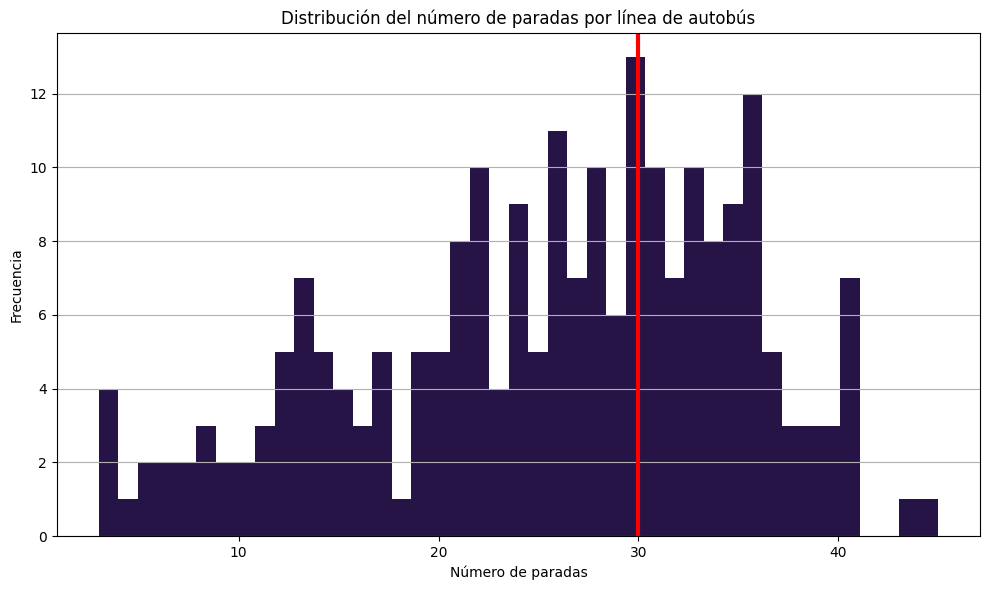

In [6]:
import matplotlib.pyplot as plt

# Calcular el número de paradas por línea
conteo_paradas_por_linea = recorrido_toA['linea'].value_counts()
moda = conteo_paradas_por_linea.mode()[0]

# Graficar el número de paradas por línea como un histograma
plt.figure(figsize=(10, 6))
plt.hist(conteo_paradas_por_linea, bins=43, color='#261447')  # Puedes ajustar el número de bins según tus datos
plt.xlabel('Número de paradas')
plt.ylabel('Frecuencia')
plt.title('Distribución del número de paradas por línea de autobús')
plt.axvline(x=moda, color='red', linestyle='-', label=f'Moda: {moda}', lw = 3)
plt.grid(axis='y')


plt.tight_layout()
plt.show()

* La mayoría de líneas tienen alrededor de 30 paradas
* Por otro lado, se observa un número considerable de líneas con 15 paradas o menos y alguna línea con más de 40 paradas 


Lineas con más paradas

In [7]:
lineas_masparadas = conteo_paradas_por_linea.head(9).reset_index()
lineas_masparadas = lineas_masparadas['linea'].tolist()
lineas_masparadas

[116, 150, 34, 174, 506, 505, 138, 137, 132]

In [18]:
df_lineas_masparadas = recorrido_toA[recorrido_toA['linea'].isin(lineas_masparadas)]
df_lineas_masparadas

,linea,stopNum,latitude,longitude,distance
233,132,1602,-3.688989,40.480695,0
234,132,1604,-3.691314,40.481037,223
235,132,3291,-3.694345,40.481762,490
236,132,3289,-3.697044,40.481503,735
237,132,1379,-3.699559,40.483033,1050
...,...,...,...,...,...
5112,174,2149,-3.677894,40.468464,13494
5113,174,206,-3.681165,40.467670,13801
5114,174,204,-3.685591,40.466972,14184
5115,174,31,-3.688325,40.466465,14422


In [19]:
import folium

# Definir el diccionario de colores
colores_linea = {
    116: 'blue',
    150: 'red',
    34: 'green',
    174: 'orange',
    506: 'purple',
    505: 'pink',
    138: 'yellow',
    137: 'black',
    132: 'lightblue'
}

attr = (
    'Tiles &copy; Esri &mdash; Esri, DeLorme, NAVTEQ, TomTom, Intermap, iPC, USGS, FAO, NPS, NRCAN, GeoBase, Kadaster NL, Ordnance Survey, Esri Japan, METI, Esri China (Hong Kong), and the GIS User Community'
)
tiles = "https://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/tile/{z}/{y}/{x}"

# Crear un mapa centrado en Madrid
lineas_masparadas_map = folium.Map(location=[40.4168, -3.7038], zoom_start=12, tiles=tiles, attr=attr)

# Añadir marcadores para cada parada
for index, row in df_lineas_masparadas.iterrows():
    # Obtener el color correspondiente a la línea actual
    color = colores_linea.get(row['linea'], 'gray')  # Usar gris como color predeterminado si la línea no está en el diccionario
    folium.Marker(location=[row['longitude'], row['latitude']], icon=folium.Icon(color=color)).add_to(lineas_masparadas_map)

# Mostrar el mapa en el notebook
display(lineas_masparadas_map)


C:\Users\DavidLopezMartin\AppData\Local\Temp\ipykernel_23380\30174689.py:28: UserWarning: color argument of Icon should be one of: {'purple', 'darkpurple', 'darkgreen', 'lightblue', 'black', 'lightred', 'blue', 'beige', 'darkred', 'darkblue', 'red', 'orange', 'lightgray', 'pink', 'lightgreen', 'green', 'white', 'cadetblue', 'gray'}.
  folium.Marker(location=[row['longitude'], row['latitude']], icon=folium.Icon(color=color)).add_to(lineas_masparadas_map)


In [20]:
import folium

# Definir el diccionario de colores
colores_linea = {
    116: 'blue',
    150: 'red',
    34: 'green',
    174: 'orange',
    506: 'purple',
    505: 'pink',
    138: 'yellow',
    137: 'black',
    132: 'lightblue'
}

attr = (
    'Tiles &copy; Esri &mdash; Esri, DeLorme, NAVTEQ, TomTom, Intermap, iPC, USGS, FAO, NPS, NRCAN, GeoBase, Kadaster NL, Ordnance Survey, Esri Japan, METI, Esri China (Hong Kong), and the GIS User Community'
)
tiles = "https://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/tile/{z}/{y}/{x}"

# Crear un mapa centrado en Madrid
lineas_masparadas_map = folium.Map(location=[40.4168, -3.7038], zoom_start=12, tiles=tiles, attr=attr)

# Crear un diccionario para almacenar las coordenadas de las líneas
lineas = {}

# Iterar sobre el DataFrame para agrupar las coordenadas por línea
for index, row in df_lineas_masparadas.iterrows():
    if row['linea'] not in lineas:
        lineas[row['linea']] = []
    # Asegurarse de que las coordenadas estén en el orden correcto (latitud, longitud)
    lineas[row['linea']].append([row['longitude'], row['latitude']])

# Agregar las líneas al mapa
for linea, coordenadas in lineas.items():
    color = colores_linea.get(linea, 'gray')
    folium.PolyLine(locations=coordenadas, color=color,weight=5).add_to(lineas_masparadas_map)
    

# Mostrar el mapa en el notebook
display(lineas_masparadas_map)

* Todas las líneas con mayor número de paradas tienen estaciones dentro de la m-30
* Van de distritos centrales a distritos de la periferia

In [21]:
lineas_menosparadas = conteo_paradas_por_linea.tail(7).reset_index()
lineas_menosparadas = lineas_menosparadas['linea'].tolist()
lineas_menosparadas

[527, 702, 718, 180, 721, 481, 709]

In [22]:
lineas_menosparadas = recorrido_toA[recorrido_toA['linea'].isin(lineas_menosparadas)]
lineas_menosparadas

,linea,stopNum,latitude,longitude,distance
2886,180,5083,-3.680126,40.369995,0
2887,180,2916,-3.694262,40.390961,2872
2888,180,3644,-3.694412,40.390726,3122
5301,481,4062,-3.619151,40.387585,0
5302,481,4063,-3.616229,40.387002,258
5303,481,1027,-3.625137,40.382607,1542
5352,527,5726,-3.593540,40.492138,0
5353,527,3542,-3.569924,40.469523,7115
5354,527,3540,-3.570929,40.464162,8476
5355,527,5620,-3.668282,40.421285,20675


In [23]:
import folium

# Definir el diccionario de colores
colores_linea = {
    180: 'blue',
    709: 'red',
    702: 'green',
    718: 'orange',
    721: 'purple',
    527: 'pink',
    481: 'yellow',
}

attr = (
    'Tiles &copy; Esri &mdash; Esri, DeLorme, NAVTEQ, TomTom, Intermap, iPC, USGS, FAO, NPS, NRCAN, GeoBase, Kadaster NL, Ordnance Survey, Esri Japan, METI, Esri China (Hong Kong), and the GIS User Community'
)
tiles = "https://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/tile/{z}/{y}/{x}"

# Crear un mapa centrado en Madrid
lineas_masparadas_map = folium.Map(location=[40.4168, -3.7038], zoom_start=12, tiles=tiles, attr=attr)

# Crear un diccionario para almacenar las coordenadas de las líneas
lineas = {}

# Iterar sobre el DataFrame para agrupar las coordenadas por línea
for index, row in lineas_menosparadas.iterrows():
    if row['linea'] not in lineas:
        lineas[row['linea']] = []
    # Asegurarse de que las coordenadas estén en el orden correcto (latitud, longitud)
    lineas[row['linea']].append([row['longitude'], row['latitude']])

# Agregar las líneas al mapa
for linea, coordenadas in lineas.items():
    color = colores_linea.get(linea, 'gray')
    folium.PolyLine(locations=coordenadas, color=color,weight=5).add_to(lineas_masparadas_map)
    

# Mostrar el mapa en el notebook
display(lineas_masparadas_map)

* Al contrario, las líneas con menos paradas se encuentran en los distritos periféricos
* Hacen recorridos muy particulares y específicos (Aeropuerto, Ifema ...)

# 3- Distritos. Distritos más o menos relevantes

In [253]:
import pandas as pd

diccionario_distritos = {
    1: "Centro",
    2: "Arganzuela",
    3: "Retiro",
    4: "Salamanca",
    5: "Chamartín",
    6: "Tetuán",
    7: "Chamberí",
    8: "Fuencarral-El Pardo",
    9: "Moncloa-Aravaca",
    10: "Latina",
    11: "Carabanchel",
    12: "Usera",
    13: "Puente de Vallecas",
    14: "Moratalaz",
    15: "Ciudad Lineal",
    16: "Hortaleza",
    17: "Villaverde",
    18: "Villa de Vallecas",
    19: "Vicálvaro",
    20: "San Blas-Canillejas",
    21: "Barajas"
}

# Crear DataFrame
df_distritos = pd.DataFrame(list(diccionario_distritos.items()), columns=['numero_distrito', 'nombre_distrito'])

df_distritos


,numero_distrito,nombre_distrito
0,1,Centro
1,2,Arganzuela
2,3,Retiro
3,4,Salamanca
4,5,Chamartín
5,6,Tetuán
6,7,Chamberí
7,8,Fuencarral-El Pardo
8,9,Moncloa-Aravaca
9,10,Latina


* Paradas contando todas las lineas

In [51]:
emt_csv = emt_csv[['codigo_estacion','codigo_parada','nombre_parada','linea','direccion_parada'	,'cp_parada','distrito_parada','longitud','latitud']]
distrito_paradas_lineas = emt_csv['distrito_parada'].value_counts()
distrito_paradas_lineas


distrito_parada
8     934
9     761
1     689
16    657
5     639
11    633
13    623
2     599
15    587
4     576
20    569
10    559
12    498
3     497
17    390
7     356
6     351
21    308
14    286
19    280
18    262
Name: count, dtype: int64

In [59]:
df_paradas_distritos = df_distritos.merge(distrito_paradas_lineas, left_on='numero_distrito', right_index=True)
df_paradas_distritos.rename(columns={'count': 'paradas_totales'}, inplace=True)
df_paradas_distritos

,numero_distrito,nombre_distrito,paradas_totales
0,1,Centro,689
1,2,Arganzuela,599
2,3,Retiro,497
3,4,Salamanca,576
4,5,Chamartín,639
5,6,Tetuán,351
6,7,Chamberí,356
7,8,Fuencarral-El Pardo,934
8,9,Moncloa-Aravaca,761
9,10,Latina,559


* Paradas unicas

In [60]:
emt_csv_paradas_unicas = emt_csv.drop_duplicates(subset = 'codigo_parada')
emt_csv_paradas_unicas = emt_csv_paradas_unicas['distrito_parada'].value_counts()


In [64]:
df_paradas_distritos_final = df_paradas_distritos.merge(emt_csv_paradas_unicas, left_on='numero_distrito', right_index=True)
df_paradas_distritos_final.rename(columns={'count':'paradas_unicas'}, inplace=True)

### Graficos

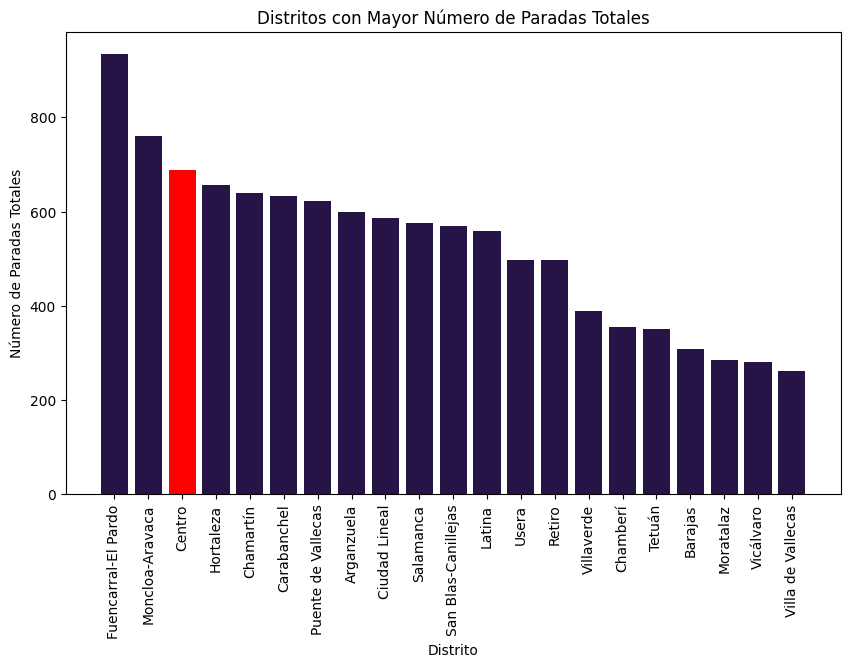

In [84]:
#Distritos con mayor número de paradas
df_sorted_total = df_paradas_distritos_final.sort_values(by='paradas_totales', ascending=False)
plt.figure(figsize=(10, 6))
colors = ['red' if x == 'Centro' else '#261447' for x in df_sorted_total['nombre_distrito']]
plt.bar(df_sorted_total['nombre_distrito'], df_sorted_total['paradas_totales'], color=colors)
plt.xlabel('Distrito')
plt.ylabel('Número de Paradas Totales')
plt.title('Distritos con Mayor Número de Paradas Totales')
plt.tick_params(axis='x', rotation=90)
plt.show()

Text(0.5, 1.0, 'Distritos con Mayor Número de Paradas Únicas')

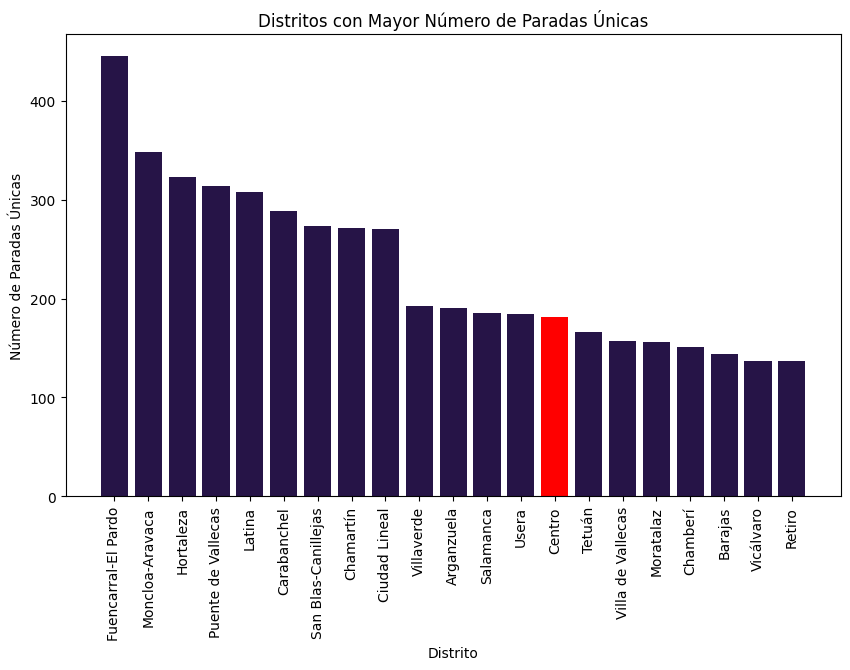

In [83]:
# Gráfico de barras para los distritos con mayor número de paradas únicas
df_sorted_unique = df_paradas_distritos_final.sort_values(by='paradas_unicas', ascending=False)
plt.figure(figsize=(10, 6))
colors = ['red' if x == 'Centro' else '#261447' for x in df_sorted_unique['nombre_distrito']]
plt.bar(df_sorted_unique['nombre_distrito'], df_sorted_unique['paradas_unicas'], color=colors)
plt.xlabel('Distrito')
plt.ylabel('Número de Paradas Únicas')
plt.tick_params(axis='x', rotation=90)
plt.title('Distritos con Mayor Número de Paradas Únicas')


# 4- Distancias

In [48]:
df_distancias = pd.read_csv('../data/stops_toA.csv')
df_distancias

,linea,stopNum,latitude,longitude,distance
0,54,3663,-3.618286,40.371544,0
1,54,4687,-3.619818,40.374194,324
2,54,4685,-3.620210,40.375886,515
3,54,1051,-3.619080,40.377892,791
4,54,1031,-3.621143,40.380133,1173
...,...,...,...,...,...
5704,702,5356,-3.721718,40.373505,1843
5705,702,3906,-3.718443,40.384606,3423
5706,709,4888,-3.607788,40.482943,0
5707,709,2912,-3.615943,40.482557,710


* Lineas con la distancia más larga y más corta

In [133]:
distancias_maximas = df_distancias.groupby('linea')['distance'].max()
distancias_minimas = df_distancias.groupby('linea')['distance'].max()
distancias_maximas = distancias_maximas.sort_values(ascending=False).head(5)
distancias_minimas = distancias_minimas.sort_values(ascending=False).tail(5)

In [137]:
distancias_maximas

linea
203    24705
527    23455
506    20719
509    19837
200    19108
Name: distance, dtype: int64

In [138]:
distancias_minimas

linea
177    2578
601    2420
92     2397
452    2055
481    1542
Name: distance, dtype: int64

In [139]:
df_distancias_maximas = df_distancias[df_distancias['linea'].isin(distancias_maximas.index)]
df_distancias_minimas = df_distancias[df_distancias['linea'].isin(distancias_minimas.index)]

In [120]:
import folium

# Lineas con la distancia más larga
colores_linea = {
    203: 'blue',
    527: 'red', 
    506: 'green',  
    509: 'yellow',    
    200: 'black'    

}

attr = (
    'Tiles &copy; Esri &mdash; Esri, DeLorme, NAVTEQ, TomTom, Intermap, iPC, USGS, FAO, NPS, NRCAN, GeoBase, Kadaster NL, Ordnance Survey, Esri Japan, METI, Esri China (Hong Kong), and the GIS User Community'
)
tiles = "https://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/tile/{z}/{y}/{x}"

# Crear un mapa centrado en Madrid
lineas_masparadas_map = folium.Map(location=[40.4168, -3.7038], zoom_start=12, tiles=tiles, attr=attr)

# Crear un diccionario para almacenar las coordenadas de las líneas
lineas = {}

# Iterar sobre el DataFrame para agrupar las coordenadas por línea
for index, row in df_distancias_maximas.iterrows():
    if row['linea'] not in lineas:
        lineas[row['linea']] = []
    # Asegurarse de que las coordenadas estén en el orden correcto (latitud, longitud)
    lineas[row['linea']].append([row['longitude'], row['latitude']])

# Agregar las líneas al mapa
for linea, coordenadas in lineas.items():
    color = colores_linea.get(linea, 'gray')
    folium.PolyLine(locations=coordenadas, color=color,weight=5).add_to(lineas_masparadas_map)
    

# Mostrar el mapa en el notebook
display(lineas_masparadas_map)

In [141]:
import folium

# Lineas con la distancia más corta
colores_linea = {
    177: 'blue',
    601: 'red', 
    92: 'green',  
    452: 'yellow',    
    481: 'black' 

}

attr = (
    'Tiles &copy; Esri &mdash; Esri, DeLorme, NAVTEQ, TomTom, Intermap, iPC, USGS, FAO, NPS, NRCAN, GeoBase, Kadaster NL, Ordnance Survey, Esri Japan, METI, Esri China (Hong Kong), and the GIS User Community'
)
tiles = "https://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/tile/{z}/{y}/{x}"

# Crear un mapa centrado en Madrid
lineas_masparadas_map = folium.Map(location=[40.4168, -3.7038], zoom_start=12, tiles=tiles, attr=attr)

# Crear un diccionario para almacenar las coordenadas de las líneas
lineas = {}

# Iterar sobre el DataFrame para agrupar las coordenadas por línea
for index, row in df_distancias_minimas.iterrows():
    if row['linea'] not in lineas:
        lineas[row['linea']] = []
    # Asegurarse de que las coordenadas estén en el orden correcto (latitud, longitud)
    lineas[row['linea']].append([row['longitude'], row['latitude']])

# Agregar las líneas al mapa
for linea, coordenadas in lineas.items():
    color = colores_linea.get(linea, 'gray')
    folium.PolyLine(locations=coordenadas, color=color,weight=5).add_to(lineas_masparadas_map)
    

# Mostrar el mapa en el notebook
display(lineas_masparadas_map)

* Mayor y menor distancia entre paradas 

In [52]:
# Calcular la distancia entre paradas
df_distancias['distancia_entre_paradas'] = df_distancias.groupby('linea')['distance'].diff().fillna(0)

# Resetear la distancia cuando cambia la línea
linea_cambia = df_distancias['linea'] != df_distancias['linea'].shift(1)
df_distancias['distancia_entre_paradas'] = df_distancias['distancia_entre_paradas'].where(~linea_cambia, 0).astype(int)
df_distancias


,linea,stopNum,latitude,longitude,distance,distancia_entre_paradas
0,54,3663,-3.618286,40.371544,0,0
1,54,4687,-3.619818,40.374194,324,324
2,54,4685,-3.620210,40.375886,515,191
3,54,1051,-3.619080,40.377892,791,276
4,54,1031,-3.621143,40.380133,1173,382
...,...,...,...,...,...,...
5704,702,5356,-3.721718,40.373505,1843,939
5705,702,3906,-3.718443,40.384606,3423,1580
5706,709,4888,-3.607788,40.482943,0,0
5707,709,2912,-3.615943,40.482557,710,710


In [216]:
distancias_parada_maximas = df_distancias.groupby('linea')['distancia_entre_paradas'].max()
distancias_parada_minimas = df_distancias.groupby('linea')['distancia_entre_paradas'].nsmallest(2).groupby(level=0).nth(1)
distancias_parada_maximas = distancias_parada_maximas.sort_values(ascending=False).head(5)
distancias_parada_minimas = distancias_parada_minimas.sort_values(ascending=False).tail(6)

In [210]:
distancias_parada_maximas

linea
527    12199
203    12199
166    11665
165    10493
200     6950
Name: distancia_entre_paradas, dtype: int32

In [183]:
df_distancias_parada_max = df_distancias[df_distancias['linea'].isin(distancias_parada_maximas.index)]
df_distancias_parada_max = df_distancias_parada_max[df_distancias_parada_max['distancia_entre_paradas'].isin(distancias_parada_maximas) | df_distancias_parada_max['distancia_entre_paradas'].isin(distancias_parada_maximas).shift(-1)]
df_distancias_parada_max

,linea,stopNum,latitude,longitude,distance,distancia_entre_paradas
2983,165,4934,-3.696295,40.487751,634,337
2984,165,7396,-3.607330,40.451801,11127,10493
2996,166,4934,-3.696295,40.487751,634,337
2997,166,1315,-3.581505,40.468808,12299,11665
5339,200,3649,-3.593518,40.492256,0,0
5340,200,4707,-3.571200,40.470309,6950,6950
5348,203,3540,-3.570929,40.464162,8476,1361
5349,203,5620,-3.668282,40.421285,20675,12199
5354,527,3540,-3.570929,40.464162,8476,1361
5355,527,5620,-3.668282,40.421285,20675,12199


In [241]:
distancias_parada_minimas = distancias_parada_minimas.loc[distancias_parada_minimas != 0]
distancias_parada_minimas_reset = distancias_parada_minimas.reset_index()
distancias_parada_minimas_reset.drop('level_1', axis=1, inplace=True)
distancias_parada_minimas_reset

,linea,distancia_entre_paradas
0,402,86
1,403,85
2,132,84
3,127,84
4,603,76


In [248]:
distancias_parada_minimas_reset_final = df_distancias[df_distancias['linea'].isin(distancias_parada_minimas_reset['linea'])]
# distancias_parada_minimas_reset_final = distancias_parada_minimas_reset[distancias_parada_minimas_reset['distancia_entre_paradas'].isin(distancias_parada_minimas_reset['distancia_entre_paradas'])]
distancias_parada_minimas_reset_final = distancias_parada_minimas_reset_final[distancias_parada_minimas_reset_final['distancia_entre_paradas'].isin(distancias_parada_minimas_reset['distancia_entre_paradas']) | distancias_parada_minimas_reset_final['distancia_entre_paradas'].isin(distancias_parada_minimas_reset['distancia_entre_paradas']).shift(-1) ]
distancias_parada_minimas_reset_final

,linea,stopNum,latitude,longitude,distance,distancia_entre_paradas
250,132,1654,-3.719331,40.465763,4430,280
251,132,4643,-3.719535,40.465104,4514,84
287,127,1654,-3.719331,40.465763,3367,280
288,127,4643,-3.719535,40.465104,3451,84
2483,402,5034,-3.676514,40.424341,8281,385
2484,402,755,-3.676133,40.424528,8367,86
3968,403,5034,-3.676514,40.424341,9492,386
3969,403,755,-3.676133,40.424528,9577,85
5631,603,4039,-3.700757,40.416319,2934,244
5632,603,4040,-3.700451,40.416311,3010,76


In [247]:
import folium

# Lineas con la distancia más corta
colores_linea = {
    165: 'blue',
    166: 'red', 
    200: 'green',  
    203: 'yellow',    
    527: 'black' 

}

attr = (
    'Tiles &copy; Esri &mdash; Esri, DeLorme, NAVTEQ, TomTom, Intermap, iPC, USGS, FAO, NPS, NRCAN, GeoBase, Kadaster NL, Ordnance Survey, Esri Japan, METI, Esri China (Hong Kong), and the GIS User Community'
)
tiles = "https://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/tile/{z}/{y}/{x}"

# Crear un mapa centrado en Madrid
lineas_masparadas_map = folium.Map(location=[40.4168, -3.7038], zoom_start=12, tiles=tiles, attr=attr)

# Crear un diccionario para almacenar las coordenadas de las líneas
lineas = {}

# Iterar sobre el DataFrame para agrupar las coordenadas por línea
for index, row in df_distancias_parada_max.iterrows():
    if row['linea'] not in lineas:
        lineas[row['linea']] = []
    # Asegurarse de que las coordenadas estén en el orden correcto (latitud, longitud)
    lineas[row['linea']].append([row['longitude'], row['latitude']])

# Agregar las líneas al mapa
for linea, coordenadas in lineas.items():
    color = colores_linea.get(linea, 'gray')
    folium.PolyLine(locations=coordenadas, color=color,weight=5).add_to(lineas_masparadas_map)
    

# Mostrar el mapa en el notebook
display(lineas_masparadas_map)

In [250]:
import folium

# Lineas con la distancia más corta
colores_linea = {
    132: 'blue',
    127: 'red', 
    402: 'green',  
    403: 'yellow',    
    603: 'black' 

}

attr = (
    'Tiles &copy; Esri &mdash; Esri, DeLorme, NAVTEQ, TomTom, Intermap, iPC, USGS, FAO, NPS, NRCAN, GeoBase, Kadaster NL, Ordnance Survey, Esri Japan, METI, Esri China (Hong Kong), and the GIS User Community'
)
tiles = "https://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/tile/{z}/{y}/{x}"

# Crear un mapa centrado en Madrid
lineas_masparadas_map = folium.Map(location=[40.4168, -3.7038], zoom_start=12, tiles=tiles, attr=attr)

# Crear un diccionario para almacenar las coordenadas de las líneas
lineas = {}

# Iterar sobre el DataFrame para agrupar las coordenadas por línea
for index, row in distancias_parada_minimas_reset_final.iterrows():
    if row['linea'] not in lineas:
        lineas[row['linea']] = []
    # Asegurarse de que las coordenadas estén en el orden correcto (latitud, longitud)
    lineas[row['linea']].append([row['longitude'], row['latitude']])

# Agregar las líneas al mapa
for linea, coordenadas in lineas.items():
    color = colores_linea.get(linea, 'gray')
    folium.PolyLine(locations=coordenadas, color=color,weight=5).add_to(lineas_masparadas_map)
    

# Mostrar el mapa en el notebook
display(lineas_masparadas_map)

## 5-Contaminación


Se pueden explorar los niveles de contaminación de cada distrito en función de la acumulación de Km recorridos 

In [24]:
df_info = pd.read_csv('../data/emt-data-clean.csv')
df_paradas = pd.read_csv('../data/stops_toA.csv')


In [47]:
df2_unique = df_info.drop_duplicates(subset='codigo_parada')

distritos_df = pd.merge(df_paradas, df2_unique[['codigo_parada', 'distrito_parada']], left_on='stopNum', right_on='codigo_parada', how='left')

# Eliminar la columna 'codigo_parada' redundante
distritos_df.drop(columns=['codigo_parada'], inplace=True)

# Renombrar la columna 'distrito_parada' para hacerla más descriptiva si es necesario
distritos_df.rename(columns={'distrito_parada': 'distrito'}, inplace=True)

distritos_df.dropna(inplace=True)

distritos_df['distrito'] = distritos_df['distrito'].astype(int)

#Ahora calculamos la distancia entre cada parada

# Calcular la distancia entre paradas
distritos_df['distancia_entre_paradas'] = distritos_df.groupby('linea')['distance'].diff().fillna(0)

# # Resetear la distancia cuando cambia la línea
linea_cambia = distritos_df['linea'] != distritos_df['linea'].shift(1)
distritos_df['distancia_entre_paradas'] = distritos_df['distancia_entre_paradas'].where(~linea_cambia, 0).astype(int)

distritos_df



,linea,stopNum,latitude,longitude,distance,distrito,distancia_entre_paradas
0,54,3663,-3.618286,40.371544,0,18,0
1,54,4687,-3.619818,40.374194,324,18,324
2,54,4685,-3.620210,40.375886,515,18,191
3,54,1051,-3.619080,40.377892,791,18,276
4,54,1031,-3.621143,40.380133,1173,18,382
...,...,...,...,...,...,...,...
5704,702,5356,-3.721718,40.373505,1843,11,939
5705,702,3906,-3.718443,40.384606,3423,11,1580
5706,709,4888,-3.607788,40.482943,0,21,0
5707,709,2912,-3.615943,40.482557,710,21,710


In [59]:
dic_distr = pd.read_csv('../data/df_distritos.csv')
dic_distr.drop(columns=['Unnamed: 0'], inplace=True)
dic_distr

,numero_distrito,nombre_distrito
0,1,Centro
1,2,Arganzuela
2,3,Retiro
3,4,Salamanca
4,5,Chamartín
5,6,Tetuán
6,7,Chamberí
7,8,Fuencarral-El Pardo
8,9,Moncloa-Aravaca
9,10,Latina


In [55]:
# Agrupamos los km recorridos 
distrito_distancia = distritos_df.groupby('distrito')['distancia_entre_paradas'].sum()
distrito_distancia_sorted = distrito_distancia.sort_values(ascending=False)
distrito_distancia_sorted

distrito
8     162520
9     146894
4     141152
16    135287
1     117919
2     117175
20    111684
11    108302
3     100665
21     99392
10     96529
5      93920
15     93860
13     90808
12     81447
19     70307
17     69070
7      66551
6      64470
14     52127
18     41326
Name: distancia_entre_paradas, dtype: int32

In [63]:
merged_df = pd.merge(distrito_distancia_sorted, dic_distr, left_on='distrito', right_on='numero_distrito')


,distancia_entre_paradas,numero_distrito,nombre_distrito
0,162520,8,Fuencarral-El Pardo
1,146894,9,Moncloa-Aravaca
2,141152,4,Salamanca
3,135287,16,Hortaleza
4,117919,1,Centro
5,117175,2,Arganzuela
6,111684,20,San Blas-Canillejas
7,108302,11,Carabanchel
8,100665,3,Retiro
9,99392,21,Barajas


Fuente: Observatorio de Servicios Urbanos
https://www.osur.es/2017/03/27/contaminacion-y-transporte-publico/

Un autobús de media emite 750 g/km de CO2, por lo que se puede calcular la cantidad de CO2 emitido en cada. Si le añadimos el área podemos obtener cuál es el distrito más contaminante por km2

In [71]:
datos_areas = {
    'numero_distrito': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21],
    'area_distrito_ha': [522.82, 646.22, 546.62, 539.24, 917.55, 537.47, 467.92, 23783.84, 4653.11, 2542.72, 
                          1404.83, 777.77, 1496.86, 610.32, 1142.57, 2741.98, 2018.76, 5146.72, 3526.67, 2229.24, 4192.28]}

# Crear DataFrame de áreas de distritos
areas_df = pd.DataFrame(datos_areas)

# Mostrar el DataFrame de áreas de distritos
areas_df

,numero_distrito,area_distrito_ha
0,1,522.82
1,2,646.22
2,3,546.62
3,4,539.24
4,5,917.55
5,6,537.47
6,7,467.92
7,8,23783.84
8,9,4653.11
9,10,2542.72


In [83]:
merged_df_2 = pd.merge(merged_df, areas_df, left_on='numero_distrito', right_on='numero_distrito')
merged_df_2['area_km2']=merged_df_2['area_distrito_ha']/100
merged_df_2['CO2_total (kg)']=(round(merged_df_2['distancia_entre_paradas']*0.75,0).astype(int))/1000
merged_df_2['CO2_superficie (Kg/Km2)']=(merged_df_2['CO2_total (kg)'])/(merged_df_2['area_km2'])
merged_df_2

,distancia_entre_paradas,numero_distrito,nombre_distrito,area_distrito_ha,area_km2,CO2_total (kg),CO2_superficie (Kg/Km2)
0,162520,8,Fuencarral-El Pardo,23783.84,237.8384,121.890,0.512491
1,146894,9,Moncloa-Aravaca,4653.11,46.5311,110.170,2.367664
2,141152,4,Salamanca,539.24,5.3924,105.864,19.632075
3,135287,16,Hortaleza,2741.98,27.4198,101.465,3.700428
4,117919,1,Centro,522.82,5.2282,88.439,16.915765
5,117175,2,Arganzuela,646.22,6.4622,87.881,13.599239
6,111684,20,San Blas-Canillejas,2229.24,22.2924,83.763,3.757469
7,108302,11,Carabanchel,1404.83,14.0483,81.226,5.781910
8,100665,3,Retiro,546.62,5.4662,75.499,13.811972
9,99392,21,Barajas,4192.28,41.9228,74.544,1.778126


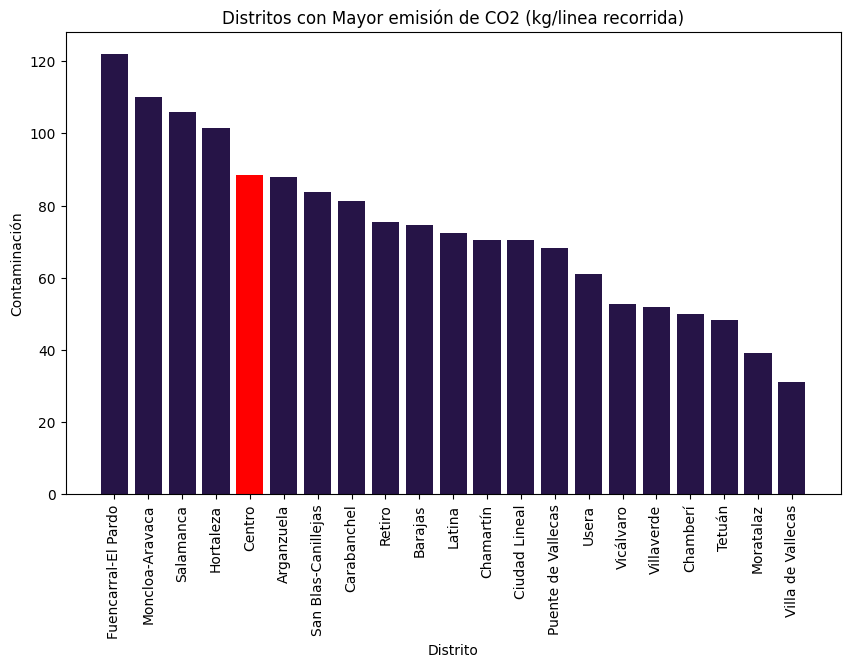

In [86]:
#Distritos con mayor contaminación total
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
colors = ['red' if x == 'Centro' else '#261447' for x in merged_df_2['nombre_distrito']]
plt.bar(merged_df_2['nombre_distrito'], merged_df_2['CO2_total (kg)'], color=colors)
plt.xlabel('Distrito')
plt.ylabel('Contaminación')
plt.title('Distritos con Mayor emisión de CO2 (kg/linea recorrida)')
plt.tick_params(axis='x', rotation=90)
plt.show()

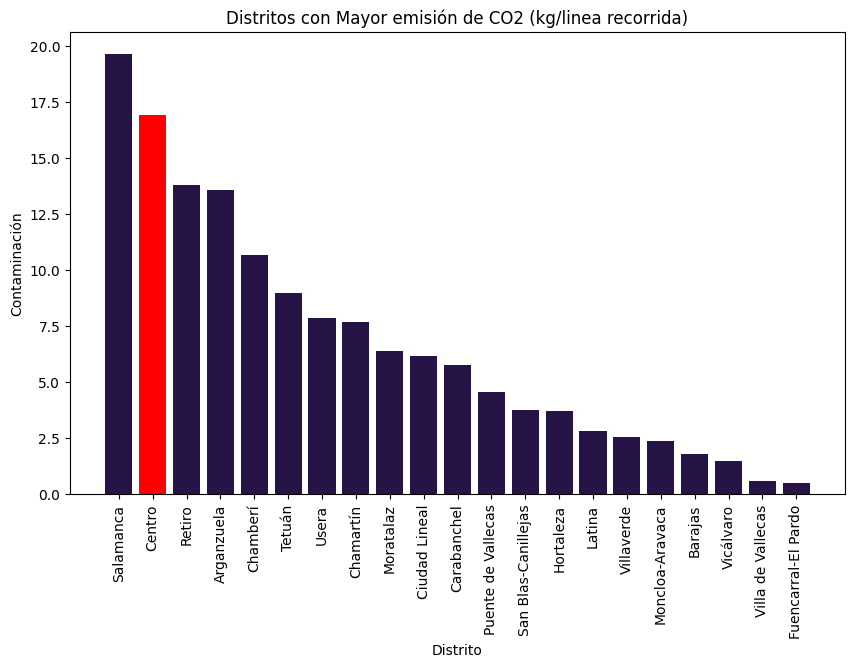

In [89]:
#Distritos con mayor contaminación total
merged_df_2.sort_values(by='CO2_superficie (Kg/Km2)',ascending=False, inplace=True)
plt.figure(figsize=(10, 6))
colors = ['red' if x == 'Centro' else '#261447' for x in merged_df_2['nombre_distrito']]
plt.bar(merged_df_2['nombre_distrito'], merged_df_2['CO2_superficie (Kg/Km2)'], color=colors)
plt.xlabel('Distrito')
plt.ylabel('Contaminación')
plt.title('Distritos con Mayor emisión de CO2 (kg/linea recorrida)')
plt.tick_params(axis='x', rotation=90)
plt.show()